### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [1]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

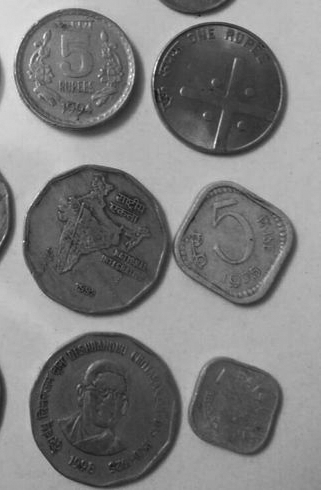

In [2]:
# 1A
monety_szare = cv2.imread('../dane1-4/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

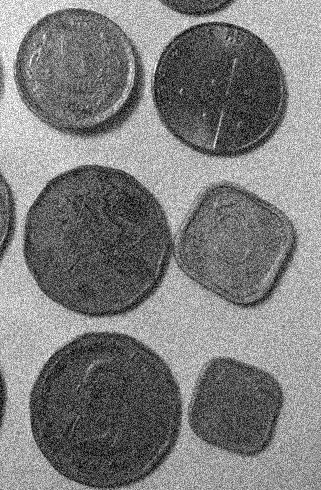

In [3]:
# 1B
monety_szare_szum = cv2.imread('../dane1-4/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

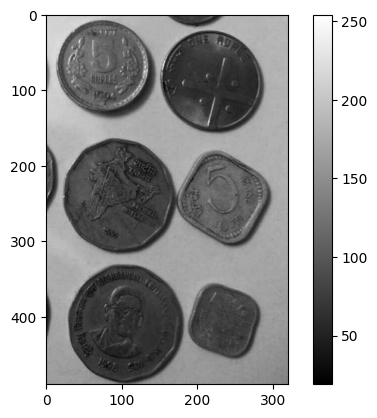

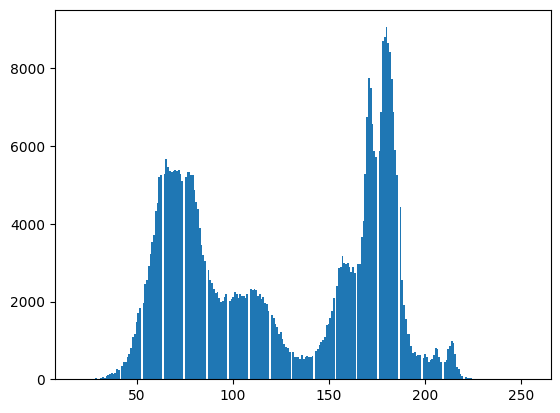

In [4]:
monety_szare_test = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)

plt.imshow(monety_szare_test, cmap='gray')
plt.colorbar()
plt.show()
plt.hist(monety_szare.flatten(), bins=256)
plt.show()

Otsu threshold:  127.0
average:  125.0572636531248


Text(0.5, 1.0, 'Value threshold: 135')

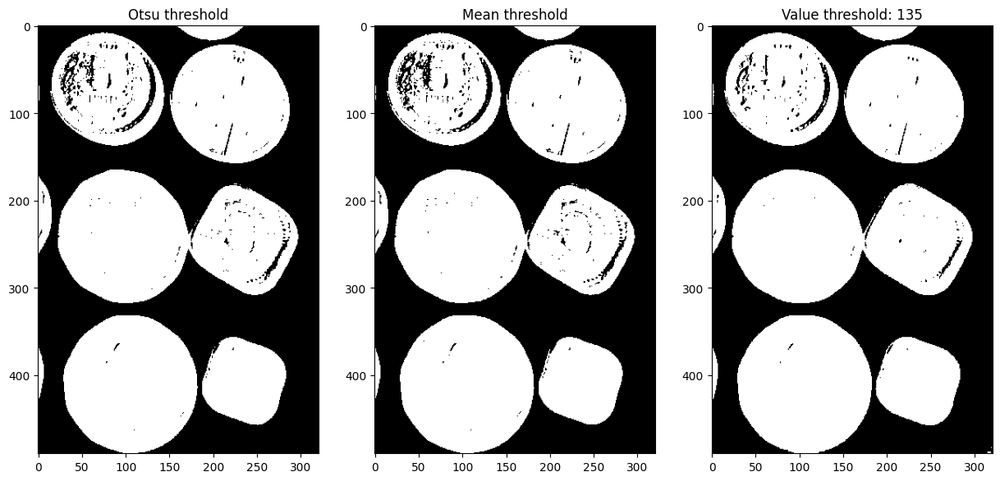

In [5]:
# otsu thresholding
T, monety_otsu = cv2.threshold(monety_szare_test, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print("Otsu threshold: ", T)

average = np.mean(monety_szare_test)
_, monety_mean = cv2.threshold(monety_szare_test, average, 255, cv2.THRESH_BINARY_INV)
print("average: ", average)

custom_threshold = 135
_, monety_custom = cv2.threshold(monety_szare_test, custom_threshold, 255, cv2.THRESH_BINARY_INV)


fig, axs = plt.subplots(1, 3, figsize=(15, 15))

axs[0].imshow(monety_otsu, cmap='gray')
axs[0].set_title("Otsu threshold")

axs[1].imshow(monety_mean, cmap='gray')
axs[1].set_title("Mean threshold")

axs[2].imshow(monety_custom, cmap='gray')
axs[2].set_title(f'Value threshold: {custom_threshold}')

Rozwiązanie części 1B:


Text(0.5, 1.0, 'Otsu thresholding')

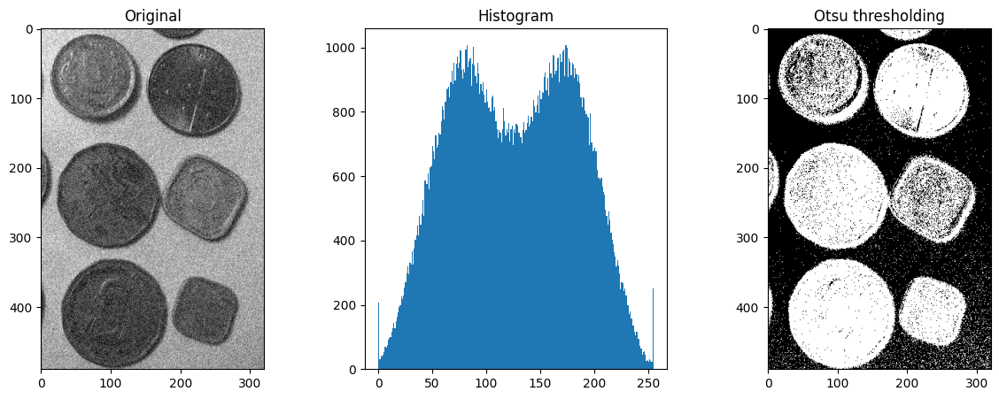

In [6]:
monety_szare_szum_test = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(monety_szare_szum_test, cmap='gray')
axs[0].set_title('Original')

axs[1].hist(monety_szare_szum_test.flatten(), bins=256)
axs[1].set_title('Histogram')

T, monety_otsu_szum = cv2.threshold(monety_szare_szum_test, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
axs[2].imshow(monety_otsu_szum, cmap='gray')
axs[2].set_title('Otsu thresholding')

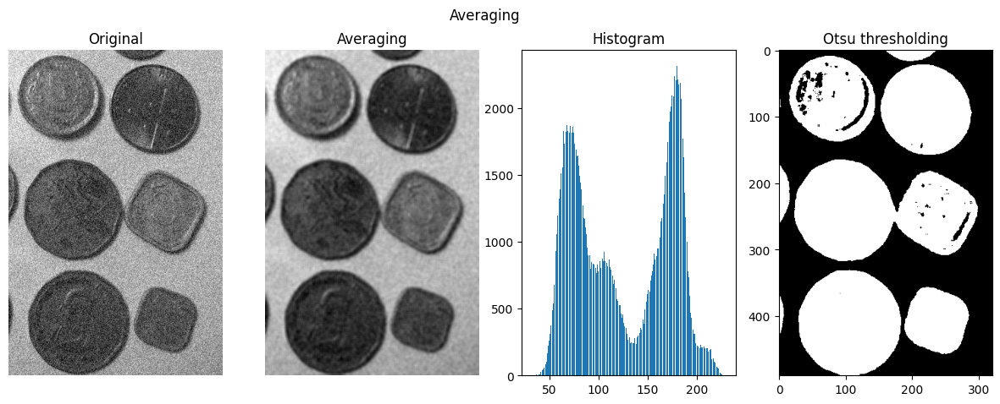

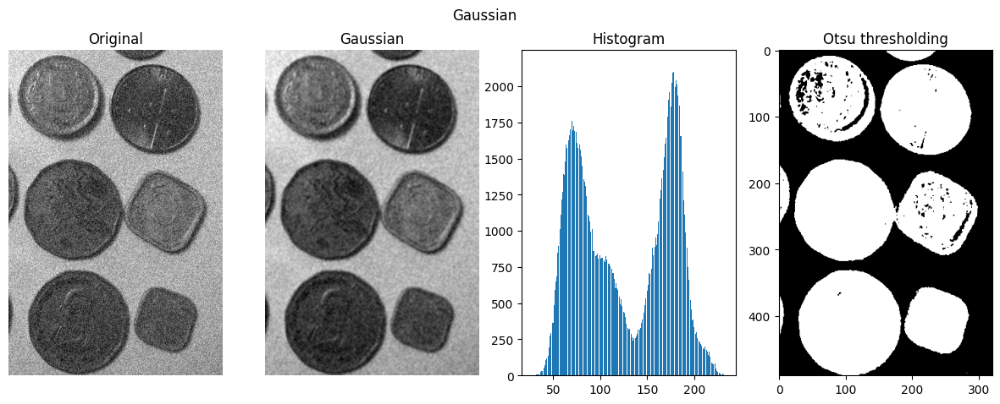

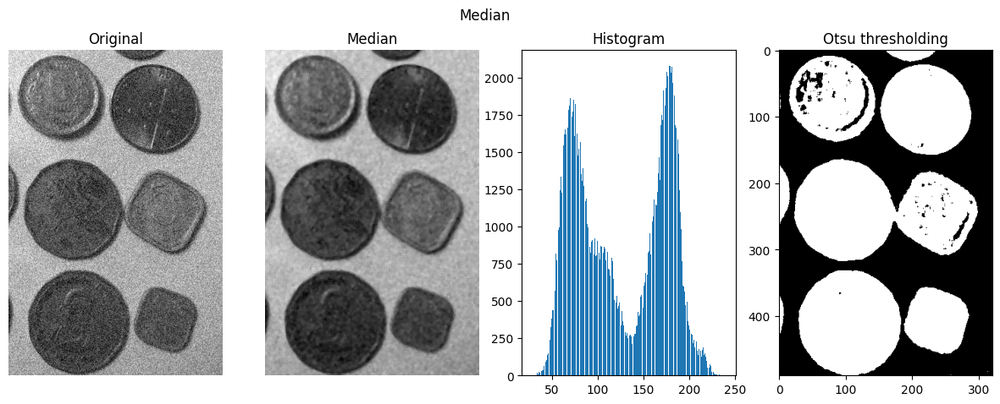

In [7]:
averageing_func = {
    'Averaging': lambda x: cv2.filter2D(x, -1, np.ones((5, 5)) / 25),
    'Gaussian': lambda x: cv2.GaussianBlur(x, (5, 5), 0),
    'Median': lambda x: cv2.medianBlur(x, 5),
}

for name, f in averageing_func.items():
    monety_szare_szum_2 = f(monety_szare_szum_test)
    fig, ax = plt.subplots(1, 4, figsize=(15, 5))

    ax[0].imshow(monety_szare_szum_test, cmap='gray')
    ax[0].set_title('Original')
    ax[0].axis('off')

    ax[1].imshow(monety_szare_szum_2, cmap='gray')
    ax[1].set_title(name)
    ax[1].axis('off')

    ax[2].hist(monety_szare_szum_2.flatten(), bins=256)
    ax[2].set_title('Histogram')

    T, monety_szare_szum_treshold = cv2.threshold(monety_szare_szum_2, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    ax[3].imshow(monety_szare_szum_treshold, cmap='gray')
    ax[3].set_title('Otsu thresholding')

    fig.suptitle(name)

    plt.show()

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

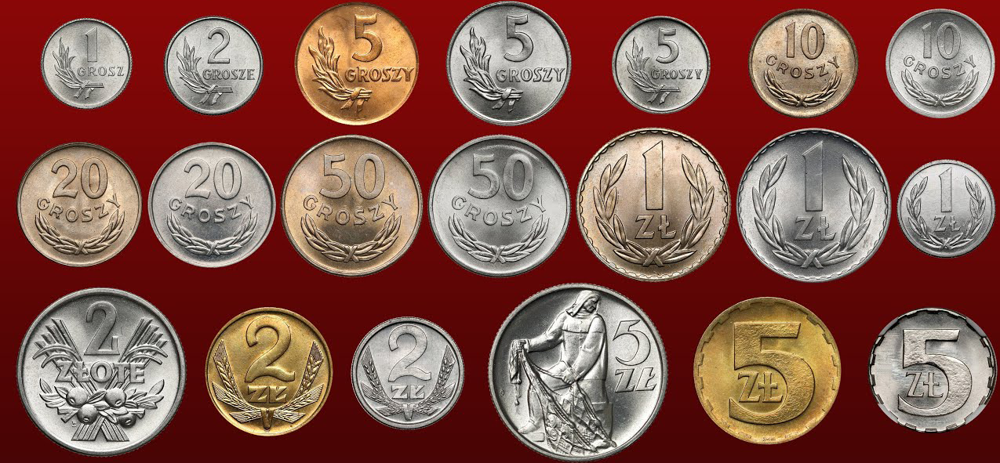

In [8]:
# 2A
monety_kolor = cv2.imread('../dane1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

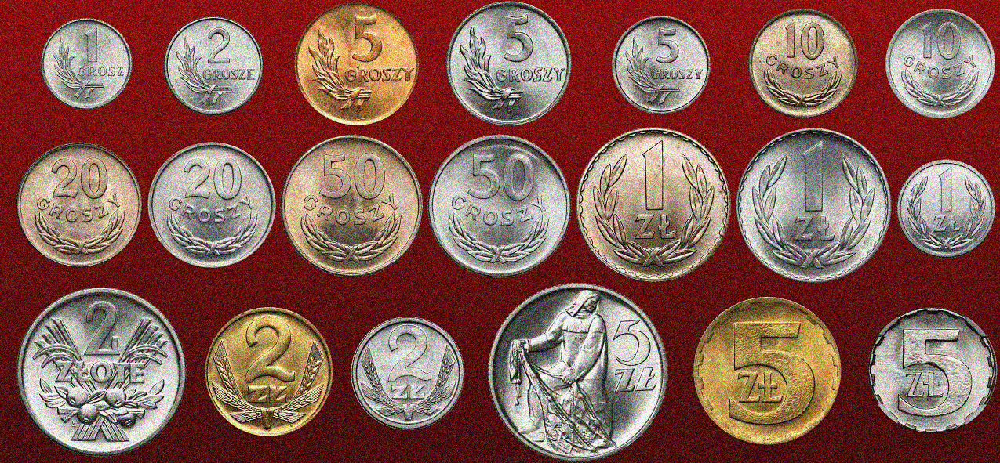

In [9]:
# 2B
monety_kolor_szum = cv2.imread('../dane1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

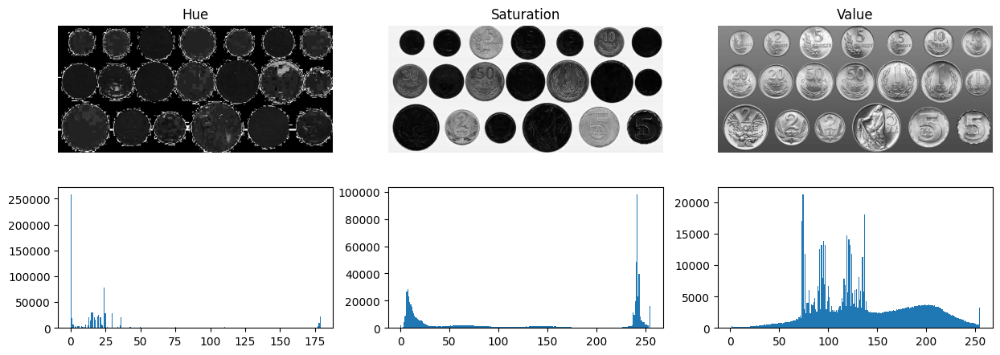

In [10]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)

h, s, v = cv2.split(monety_kolor_hsv)

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, channel in enumerate([h, s, v]):
    axs[0, i].imshow(channel, cmap='gray')
    axs[0, i].set_title(['Hue', 'Saturation', 'Value'][i])
    axs[0, i].axis('off')

    axs[1, i].hist(channel.flatten(), bins=256)


Using hue

Text(0.5, 1.0, 'Original')

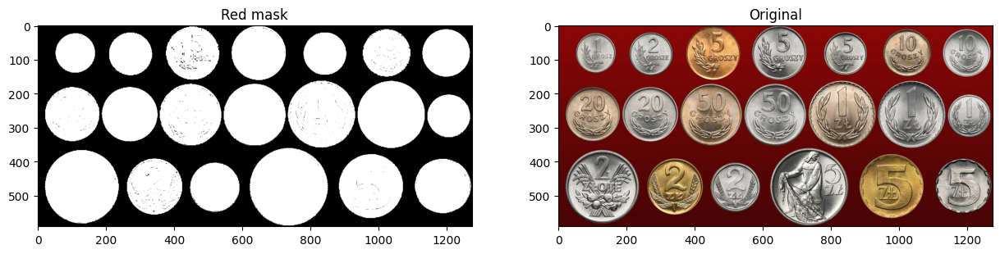

In [11]:
red_mask = cv2.inRange(monety_kolor_hsv, (0, 100, 20), (10, 255, 255))
red_mask += cv2.inRange(monety_kolor_hsv, (170, 100, 20), (180, 255, 255))
red_mask = cv2.bitwise_not(red_mask)


fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(red_mask, cmap='gray')
axs[0].set_title('Red mask')

axs[1].imshow(monety_kolor[..., ::-1])
axs[1].set_title('Original')

Using Saturation

Otsu threshold:  131.0


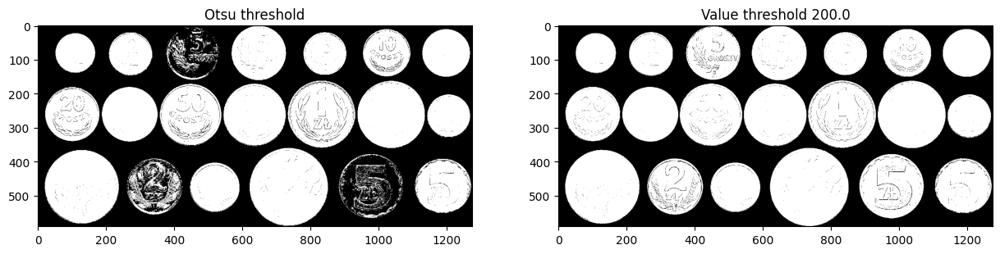

In [12]:
T, monety_kolor_treshold_otsu = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print("Otsu threshold: ", T)

T, monety_kolor_treshold = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_treshold_otsu, cmap='gray')
axs[0].set_title('Otsu threshold')

axs[1].imshow(monety_kolor_treshold, cmap='gray')
axs[1].set_title(f'Value threshold {T}')

plt.show()

Text(0.5, 1.0, 'Original')

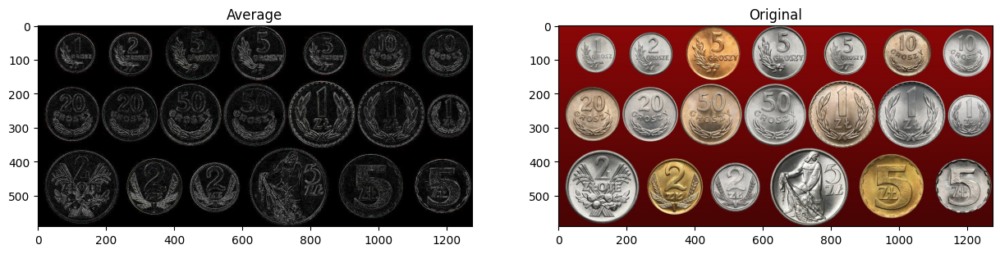

In [13]:
# kernel for edge
kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])

monety_kolor_kernel = cv2.filter2D(monety_kolor, -1, kernel)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_kernel[..., ::-1])
axs[0].set_title('Average')

axs[1].imshow(monety_kolor[..., ::-1])
axs[1].set_title('Original')


Rozwiązanie części 2B:


Text(0.5, 1.0, 'Average')

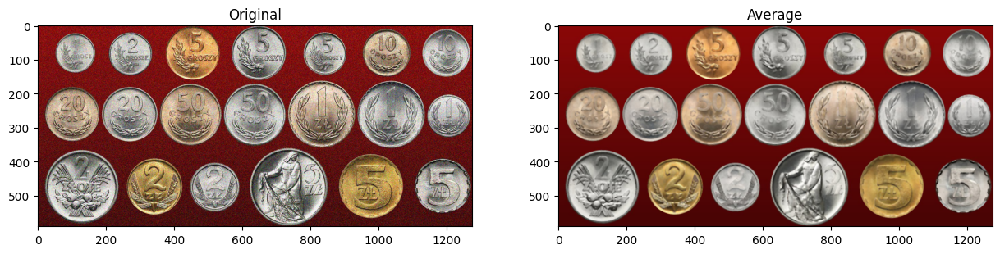

In [14]:
monety_kolor_avg = cv2.medianBlur(monety_kolor, 5)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_szum[..., ::-1])
axs[0].set_title('Original')

axs[1].imshow(monety_kolor_avg[..., ::-1])
axs[1].set_title('Average')


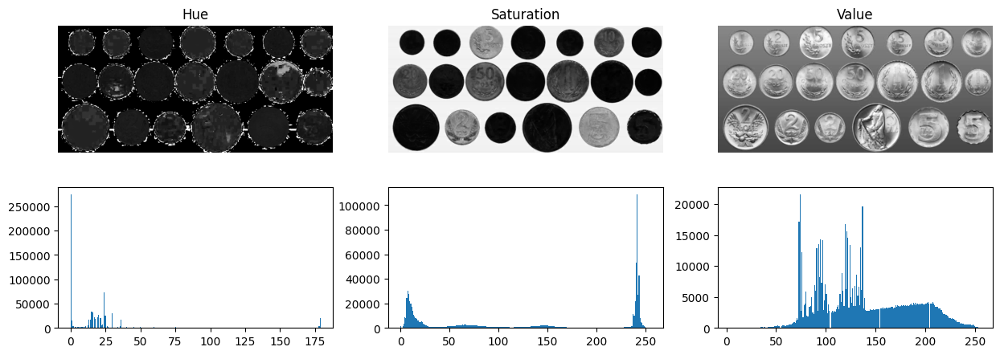

In [15]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor_avg, cv2.COLOR_BGR2HSV)

h, s, v = cv2.split(monety_kolor_hsv)

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, channel in enumerate([h, s, v]):
    axs[0, i].imshow(channel, cmap='gray')
    axs[0, i].set_title(['Hue', 'Saturation', 'Value'][i])
    axs[0, i].axis('off')

    axs[1, i].hist(channel.flatten(), bins=256)

Text(0.5, 1.0, 'Original')

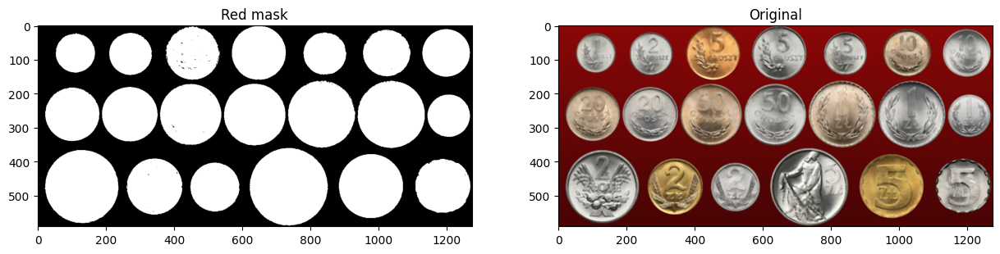

In [16]:
# by hue
red_mask = cv2.inRange(monety_kolor_hsv, (0, 100, 20), (10, 255, 255))
red_mask += cv2.inRange(monety_kolor_hsv, (170, 100, 20), (180, 255, 255))
red_mask = cv2.bitwise_not(red_mask)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(red_mask, cmap='gray')
axs[0].set_title('Red mask')

axs[1].imshow(monety_kolor_avg[..., ::-1])
axs[1].set_title('Original')

Otsu threshold:  128.0


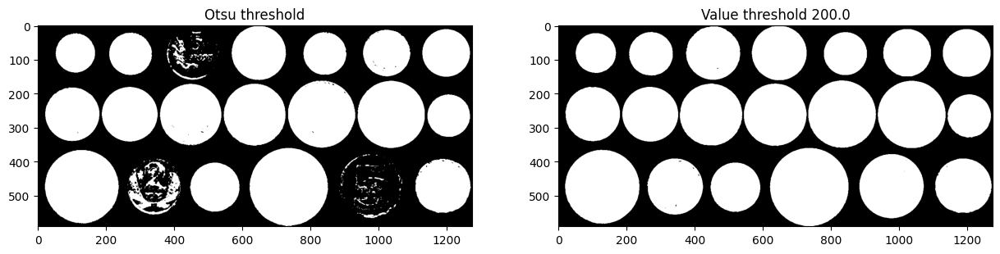

In [17]:
# by saturation
T, monety_kolor_treshold_otsu = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print("Otsu threshold: ", T)

T, monety_kolor_treshold = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_treshold_otsu, cmap='gray')
axs[0].set_title('Otsu threshold')

axs[1].imshow(monety_kolor_treshold, cmap='gray')
axs[1].set_title(f'Value threshold {T}')

plt.show()


##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

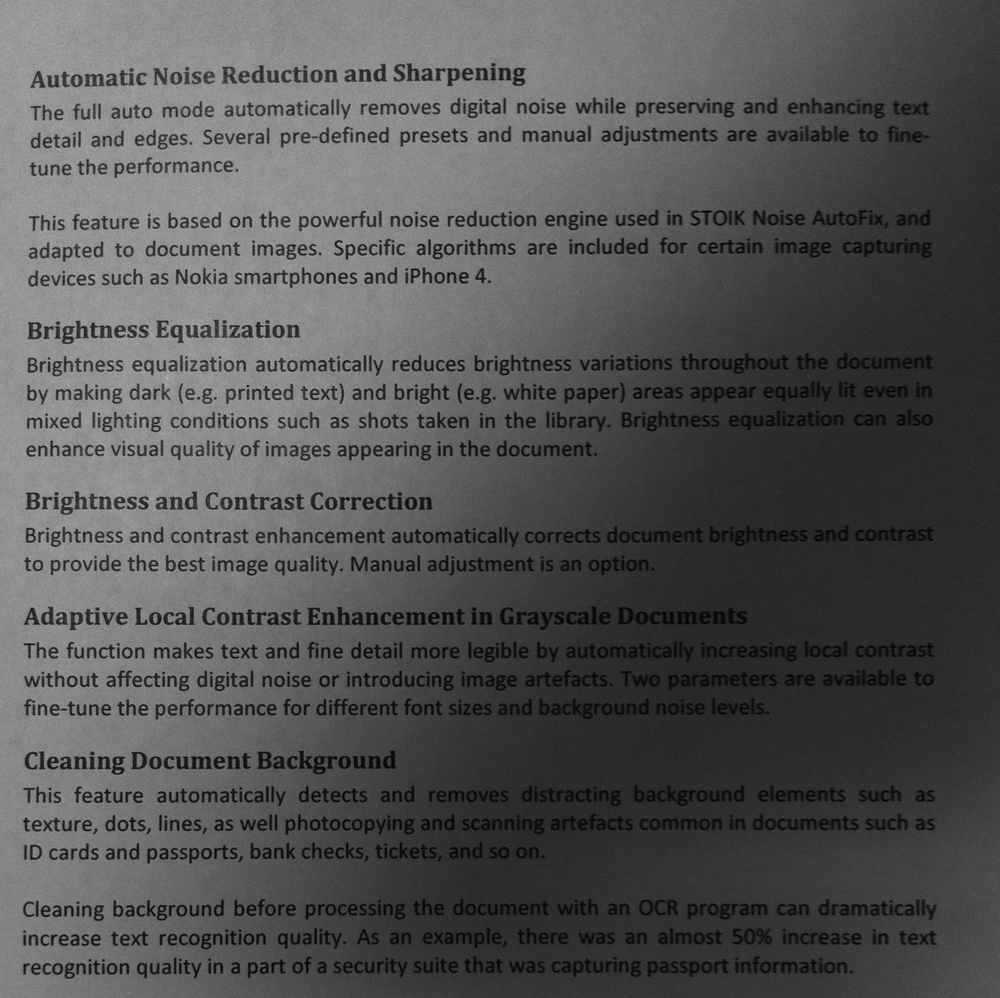

In [18]:
tekst = cv2.imread('../dane1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

treshold:  89.0


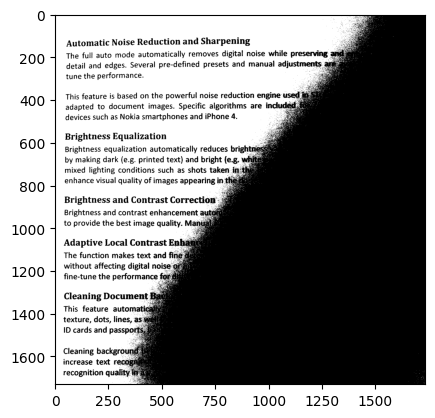

In [19]:
tekst_gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

T, tekst_treshold = cv2.threshold(tekst_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

print("treshold: ", T)
plt.imshow(tekst_treshold, cmap='gray')

In [20]:
tekst.shape

(1731, 1734, 3)

In [21]:
def treshold_local(img, window=50, step=25, mean=False, c=15):
    height, width = img.shape
    
    result = np.zeros_like(img, dtype=np.float64)
    weight_sum = np.zeros_like(img, dtype=np.float64)

    for height_local in range(0, height - window + 1, step):
        for width_local in range(0, width - window + 1, step):
            img_local = img[height_local:height_local + window, width_local:width_local + window]
            if mean:
                avg = np.mean(img_local) - c
                _, img_treshold = cv2.threshold(img_local, avg, 255, cv2.THRESH_BINARY)
            else:
                T, img_treshold = cv2.threshold(img_local, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                T -= c
                _, img_treshold = cv2.threshold(img_local, T, 255, cv2.THRESH_BINARY)

            weight = np.ones_like(img_local, dtype=np.float64)

            result[height_local:height_local + window, width_local:width_local + window] += img_treshold
            weight_sum[height_local:height_local + window, width_local:width_local + window] += weight

    non_zero_mask = weight_sum > 0
    result[non_zero_mask] /= weight_sum[non_zero_mask]

    return result.astype(np.uint8)



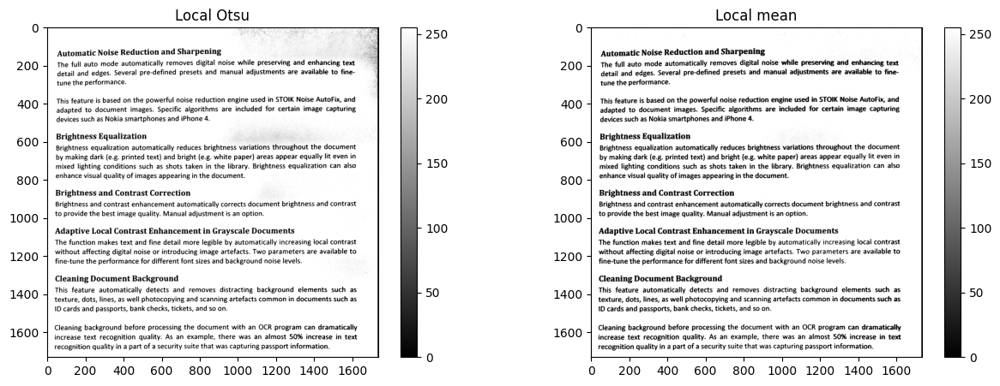

In [22]:

window_size = 151
step_size = 5

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

img1 = axs[0].imshow(treshold_local(tekst_gray, window_size, step_size, c=7), cmap='gray')
axs[0].set_title('Local Otsu')

img2 = axs[1].imshow(treshold_local(tekst_gray, window_size, step_size, mean=True), cmap='gray')
axs[1].set_title('Local mean')

fig.colorbar(img1, ax=axs[0])
fig.colorbar(img2, ax=axs[1])

plt.show()

Text(0.5, 1.0, 'Adaptive tresholding with window size: 151 and C: 15')

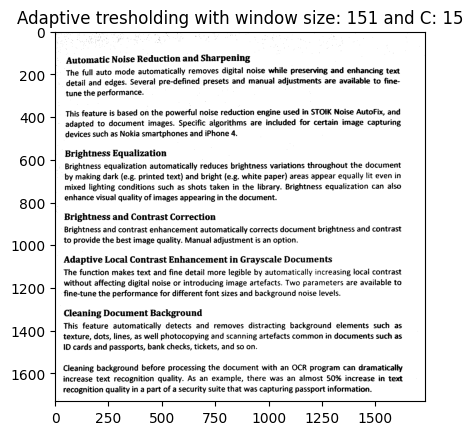

In [23]:
# USE adaptiveThreshold

window_size = 151
C = 15

tekst_treshold_adaptive = cv2.adaptiveThreshold(tekst_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, window_size, C)
plt.imshow(tekst_treshold_adaptive, cmap='gray')
plt.title('Adaptive tresholding with window size: {} and C: {}'.format(window_size, C))